In [1]:
from pathlib import Path
import sys
import celltypist
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
sc.set_figure_params(dpi=150, ipython_format='retina')

/opt/miniconda3/envs/scRNA-seq-analysis/lib/python3.13/site-packages/celltypist/classifier.py:11: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('scanpy')` instead
  from scanpy import __version__ as scv


In [2]:
PROJECT_ROOT = Path.cwd().parent

if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

In [3]:
# Load adata object that contains clustering labels
adata_qc_path = PROJECT_ROOT / "data" / "interim" / "E-MTAB-8410_qc.h5ad"
adata_qc = sc.read_h5ad(adata_qc_path)

In [4]:
# Confirm input matrix for CellTypist
print(adata_qc.X.min(), adata_qc.X.max())
print(adata_qc.var_names[:10].tolist())
print(adata_qc.var.columns)
print(adata_qc.var["gene_symbol"].head(10).tolist())

0.0 8.878158564180056
['ENSG00000000003', 'ENSG00000000005', 'ENSG00000000419', 'ENSG00000000457', 'ENSG00000000460', 'ENSG00000000938', 'ENSG00000000971', 'ENSG00000001036', 'ENSG00000001084', 'ENSG00000001167']
Index(['source_gene_id', 'gene_symbol', 'mt', 'ribo', 'hb',
       'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts',
       'total_counts', 'highly_variable', 'means', 'dispersions',
       'dispersions_norm', 'highly_variable_nbatches',
       'highly_variable_intersection'],
      dtype='str')
['TSPAN6', 'TNMD', 'DPM1', 'SCYL3', 'C1orf112', 'FGR', 'CFH', 'FUCA2', 'GCLC', 'NFYA']


In [5]:
celltypist.models.models_description()["model"].tolist()

👉 Detailed model information can be found at `https://www.celltypist.org/models`


['Immune_All_Low.pkl',
 'Immune_All_High.pkl',
 'Adult_COVID19_PBMC.pkl',
 'Adult_CynomolgusMacaque_Hippocampus.pkl',
 'Adult_Human_MTG.pkl',
 'Adult_Human_PancreaticIslet.pkl',
 'Adult_Human_PrefrontalCortex.pkl',
 'Adult_Human_Skin.pkl',
 'Adult_Human_Vascular.pkl',
 'Adult_Mouse_Gut.pkl',
 'Adult_Mouse_OlfactoryBulb.pkl',
 'Adult_Pig_Hippocampus.pkl',
 'Adult_RhesusMacaque_Hippocampus.pkl',
 'Adult_cHSPCs_Illumina.pkl',
 'Adult_cHSPCs_Ultima.pkl',
 'Autopsy_COVID19_Lung.pkl',
 'COVID19_HumanChallenge_Blood.pkl',
 'COVID19_Immune_Landscape.pkl',
 'Cells_Adult_Breast.pkl',
 'Cells_Fetal_Lung.pkl',
 'Cells_Human_Tonsil.pkl',
 'Cells_Intestinal_Tract.pkl',
 'Cells_Lung_Airway.pkl',
 'Developing_Human_Brain.pkl',
 'Developing_Human_Gonads.pkl',
 'Developing_Human_Hippocampus.pkl',
 'Developing_Human_Organs.pkl',
 'Developing_Human_Thymus.pkl',
 'Developing_Mouse_Brain.pkl',
 'Developing_Mouse_Hippocampus.pkl',
 'Fetal_Human_AdrenalGlands.pkl',
 'Fetal_Human_Pancreas.pkl',
 'Fetal_Human_P

In [6]:
# Run Cell Typist
adata_qc.var_names = (
    adata_qc.var["gene_symbol"]
    .astype(str)
)
adata_qc.var_names_make_unique()

try:
    predictions_crc = celltypist.annotate(
        adata_qc,
        model="Human_Colorectal_Cancer.pkl", # downloaded using celltypist.models.model_download(model = "Human_Colorectal_Cancer.pkl")
        majority_voting=True,
    )
finally:
    adata_qc.var_names = adata_qc.var["source_gene_id"]

🔬 Input data has 47103 cells and 38263 genes
🔗 Matching reference genes in the model
🧬 3945 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 20
🗳️ Majority voting the predictions
✅ Majority voting done!


In [7]:
predictions_crc.predicted_labels.head()

,predicted_labels,over_clustering,majority_voting
SAMEA6057388-AAAACCGAGATGGGTC,Tip-like ECs,0,Stalk-like ECs
SAMEA6057388-AAAACCGCATGAACCT,CMS1,2,CMS3
SAMEA6057388-AAAACCGGTATAGGTA,Myofibroblasts,3,Myofibroblasts
SAMEA6057388-AAAACCGGTTGCGTTA,SPP1+,6,CMS3
SAMEA6057388-AAAACCGTCGATGAGG,Stromal 3,9,Stromal 3


In [8]:
# Insert confidence score
predictions_crc.to_adata(
    insert_labels=True,
    insert_conf=True,
    insert_conf_by="majority_voting",
    prefix="celltypist_crc_",
)

AnnData object with n_obs × n_vars = 47103 × 38263
    obs: 'age', 'developmental_stage', 'disease', 'individual', 'organism_part', 'organism', 'sampling_site', 'sex', 'inferred_cell_type_-_ontology_labels', 'inferred_cell_type_-_authors_labels', 'sampling_site.1', 'age_ontology', 'developmental_stage_ontology', 'disease_ontology', 'individual_ontology', 'organism_part_ontology', 'organism_ontology', 'sampling_site_ontology', 'sex_ontology', 'inferred_cell_type_-_ontology_labels_ontology', 'inferred_cell_type_-_authors_labels_ontology', 'sampling_site_ontology.1', 'biosample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'is_good_sample', 'qc_low_counts', 'qc_low_genes', 'qc_high_mt', 'qc_very_low_genes', 'qc_very_high_mt', 'qc_fail_good_sample', 'qc_keep_cell_from_bad_sample', 'leiden_0_05', 'leiden_0_1', 'leiden_0_5', 'celltypist_crc_predicted_labels', 'celltypist_crc_over_clust

In [9]:
# Insert predictions in adata_qc
celltypist_obs_columns = [
    "celltypist_crc_predicted_labels",
    "celltypist_crc_over_clustering",
    "celltypist_crc_majority_voting",
    "celltypist_crc_conf_score",
]

for column in celltypist_obs_columns:
    adata_qc.obs[column] = (
        predictions_crc.adata.obs[column]
        .reindex(adata_qc.obs_names)
    )

In [10]:
display(
    adata_qc.obs["celltypist_crc_majority_voting"]
    .value_counts(dropna=False)
)

adata_qc.obs["celltypist_crc_conf_score"].describe()

celltypist_crc_majority_voting
CMS3                         5967
CD4+ T cells                 3970
CMS2                         3961
CD19+CD20+ B                 3679
IgA+ Plasma                  3508
Stromal 3                    3282
CD8+ T cells                 2609
SPP1+                        2345
Myofibroblasts               1997
Regulatory T cells           1775
Pro-inflammatory             1713
IgG+ Plasma                  1486
Stalk-like ECs               1290
Tip-like ECs                  887
Stem-like/TA                  855
T helper 17 cells             847
Intermediate                  836
Pericytes                     717
Enteric glial cells           686
Mast cells                    640
Smooth muscle cells           614
Stromal 1                     605
Unknown                       575
Stromal 2                     529
cDC                           519
NK cells                      302
T follicular helper cells     277
Goblet cells                  260
gamma delta T cel

count    4.710300e+04
mean     6.546601e-01
std      4.096281e-01
min      7.217530e-15
25%      1.721082e-01
50%      9.245824e-01
75%      9.992269e-01
max      1.000000e+00
Name: celltypist_crc_conf_score, dtype: float64

The confidence distribution is highly polarized: the median confidence is 0.925, but 25% of cells have scores at or below 0.172. That means many cells were classified with very high confidence, while a substantial lower-confidence subset needs closer review rather than automatic acceptance. The reference model has identified broad colorectal tissue compartments and more specific subtypes:

| Compartment            | CellTypist labels                                                                                         | Initial interpretation                                                                       |
| ---------------------- | --------------------------------------------------------------------------------------------------------------------------- | -------------------------------------------------------------------------------------------- |
| Epithelial / tumor     | CMS2, CMS3, Stem-like/TA, Goblet cells, Intermediate                                                                        | CRC-related epithelial transcriptional programs and epithelial differentiation states        |
| T / NK lymphocytes     | CD4+ T cells, CD8+ T cells, Regulatory T cells, T helper 17 cells, T follicular helper cells, gamma delta T cells, NK cells | Strong evidence of diverse adaptive and innate lymphoid infiltration                         |
| B / plasma cells       | CD19+CD20+ B, IgA+ Plasma, IgG+ Plasma                                                                                      | B-cell and antibody-secreting plasma-cell populations                                        |
| Myeloid / dendritic    | SPP1+, Pro-inflammatory, cDC                                                                                                | Likely macrophage-associated, inflammatory myeloid, and conventional dendritic-cell programs |
| Fibroblast / stromal   | Stromal 1, Stromal 2, Stromal 3, Myofibroblasts, Pericytes, Smooth muscle cells                                             | Fibroblast states, contractile stromal cells, and mural cells                                |
| Endothelial / vascular | Stalk-like ECs, Tip-like ECs, Lymphatic ECs                                                                                 | Blood-vessel endothelial states and lymphatic endothelial cells                              |
| Other tissue-resident  | Enteric glial cells, Mast cells                                                                                             | Plausible rare colorectal-resident populations                                               |
| Uncertain              | Unknown                                                                                                                     | Cells that the model could not assign confidently to a reference class                       |

In [11]:
# Confidence by label
confidence_by_label = (
    adata_qc.obs
    .groupby("celltypist_crc_majority_voting", observed=True)[
        "celltypist_crc_conf_score"
    ]
    .agg(
        n_cells="size",
        median_confidence="median",
        q25_confidence=lambda x: x.quantile(0.25),
        mean_confidence="mean",
    )
    .sort_values("median_confidence")
)

confidence_by_label.round(3)

,n_cells,median_confidence,q25_confidence,mean_confidence
celltypist_crc_majority_voting,,,,
gamma delta T cells,196,0.033,0.001,0.271
Unknown,575,0.038,0.001,0.287
Intermediate,836,0.168,0.041,0.299
Stalk-like ECs,1290,0.204,0.013,0.424
CD8+ T cells,2609,0.259,0.008,0.431
T follicular helper cells,277,0.359,0.006,0.458
cDC,519,0.437,0.029,0.472
Pro-inflammatory,1713,0.469,0.036,0.495
CD4+ T cells,3970,0.578,0.033,0.521


The strongest CellTypist results are those with high median confidence and high lower-quartile confidence. A high q25_confidence means the signal is consistently strong across most cells in that label, not merely high for a subset.

| CellTypist label    | Cells | Median confidence | 25th percentile | Interpretation                                                        |
| ------------------- | ----- | ----------------- | --------------- | --------------------------------------------------------------------- |
| CD19+CD20+ B        | 3,679 | 1.000             | 1.000           | Exceptionally clean and consistent B-cell population                  |
| Enteric glial cells | 686   | 1.000             | 0.996           | Very clear rare tissue-resident population                            |
| Stromal 3           | 3,282 | 1.000             | 0.995           | Strong, coherent stromal program                                      |
| Mast cells          | 640   | 0.999             | 0.975           | Very clear mast-cell population                                       |
| Stromal 1           | 605   | 0.993             | 0.812           | Strongly separated fibroblast/stromal subtype                         |
| Stem-like/TA        | 855   | 0.975             | 0.748           | Clear epithelial stem/transit-amplifying program                      |
| Smooth muscle cells | 614   | 0.992             | 0.692           | Clear contractile smooth-muscle program                               |
| Pericytes           | 717   | 0.975             | 0.577           | Good mural-cell separation                                            |
| Myofibroblasts      | 1,997 | 0.990             | 0.522           | Strong contractile fibroblast population                              |
| IgA+ Plasma         | 3,508 | 0.870             | 0.488           | Good plasma-cell signal; some within-label variability                |
| IgG+ Plasma         | 1,486 | 0.811             | 0.245           | Plausible and fairly strong, but less uniform than IgA plasma cells   |
| SPP1+               | 2,345 | 0.860             | 0.178           | Strong central tendency, but heterogeneous lower-confidence component |

Other labels could be consolidated intro broad compartments:

| Labels                                                                                       | Why caution is needed                                                                                     | Sensible provisional broader label                                  |
| -------------------------------------------------------------------------------------------- | ------------------------------------------------------------------------------------------------------------- | ----------------------------------------------------------- |
| CMS2, CMS3, Intermediate                                                                     | Epithelial/tumor programs can overlap, and Intermediate has low median confidence (0.168)                     | Epithelial / tumor; retain CMS program as a secondary label |
| CD4+ T cells, CD8+ T cells, Regulatory T cells, T helper 17 cells, T follicular helper cells | Some have moderate/low confidence; T-cell states lie on transcriptional continua and may blur at cell level   | T cell, with subtypes retained as provisional               |
| SPP1+, Pro-inflammatory, cDC                                                                 | Myeloid populations are heterogeneous and can share inflammatory/antigen-presentation programs                | Myeloid                                                     |
| Stalk-like ECs, Tip-like ECs                                                                 | Endothelial state labels can form continuous angiogenic programs; Stalk-like ECs is relatively low confidence | Endothelial                                                 |
| gamma delta T cells                                                                          | Median 0.033 and n=196n=196n=196 is too weak for a robust fine subtype call                                   | T/NK or low-confidence T cell                               |
| Unknown                                                                                      | Designed by the classifier to capture uncertain cells                                                         | Unknown / uncertain                                         |

CellTypist produced clear and high-confidence separation of several major colorectal tissue populations, including CD19+CD20+ B cells, IgA+ plasma cells, mast cells, enteric glial cells, stromal subtypes, myofibroblasts, pericytes, and smooth muscle cells. In contrast, several T-cell, myeloid, endothelial, and epithelial program labels showed lower or more heterogeneous confidence, indicating that these populations require cluster-level marker validation and, where appropriate, broader provisional annotations. Next, the concordance betwen Leiden clusters and CellTypist annotations was evaluated.

In [12]:
# cluster-label composition

cluster_label_proportions = pd.crosstab(
adata_qc.obs["leiden_0_5"],
adata_qc.obs["celltypist_crc_majority_voting"],
normalize="index",
)


dominant_label_by_cluster = pd.DataFrame(
    {
        "cluster": cluster_label_proportions.index,
        "dominant_cell_type": cluster_label_proportions.idxmax(axis=1),
        "dominant_cell_type_pct": (
            cluster_label_proportions.max(axis=1) * 100
        ).round(1),
    }
).reset_index(drop=True)

dominant_label_by_cluster.sort_values("dominant_cell_type_pct")

,cluster,dominant_cell_type,dominant_cell_type_pct
2,2,Pericytes,39.1
12,12,Stem-like/TA,41.8
5,5,SPP1+,49.6
7,7,CD4+ T cells,54.5
0,0,Stalk-like ECs,54.8
9,9,CD4+ T cells,56.1
19,19,Stromal 1,65.6
10,10,CMS2,67.5
8,8,CD8+ T cells,68.8
4,4,Myofibroblasts,70.8


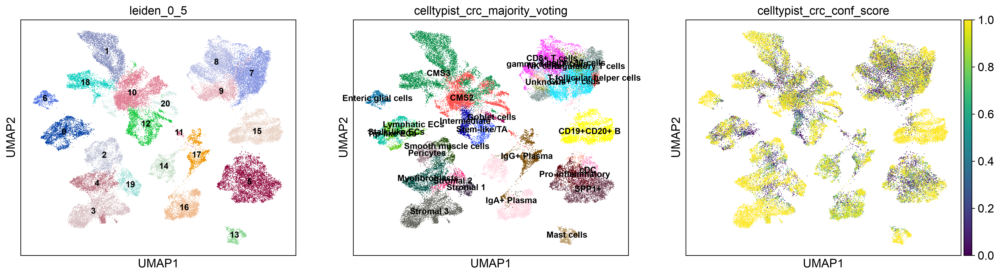

In [13]:
with plt.rc_context({"figure.figsize": (6, 5)}):
    sc.pl.umap(
    adata_qc,
    wspace=0.1,
    color=[
        "leiden_0_5",
        "celltypist_crc_majority_voting",
        "celltypist_crc_conf_score",
    ],
    legend_loc="on data",
    legend_fontsize=10
)

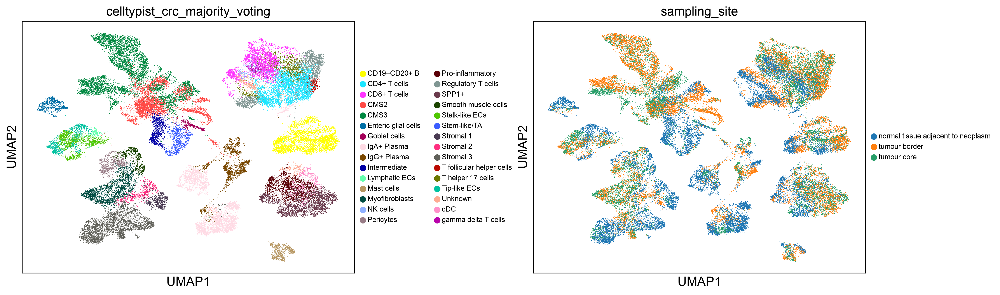

In [14]:
with plt.rc_context({"figure.figsize": (6, 5)}):
    sc.pl.umap(
    adata_qc,
    wspace=0.4,
    color=[
        "celltypist_crc_majority_voting",
        "sampling_site",
    ],
    legend_fontsize=8
)

In [15]:
adata_qc.obs["inferred_cell_type_-_ontology_labels"].unique()

[NaN, 'myeloid cell', 'regulatory T cell', 'myofibroblast', 'stromal cell of lamina propria of colon', ..., 'T-helper 17 cell', 'plasma cell', 'goblet cell', 'gamma-delta T cell', 'tuft cell of colon']
Length: 30
Categories (29, str): ['B cell', 'CD4-positive, alpha-beta T cell', 'CD8-positive, alpha-beta T cell', 'IgA plasma cell', ..., 'regulatory T cell', 'smooth muscle cell of large intestine', 'stromal cell of lamina propria of colon', 'tuft cell of colon']

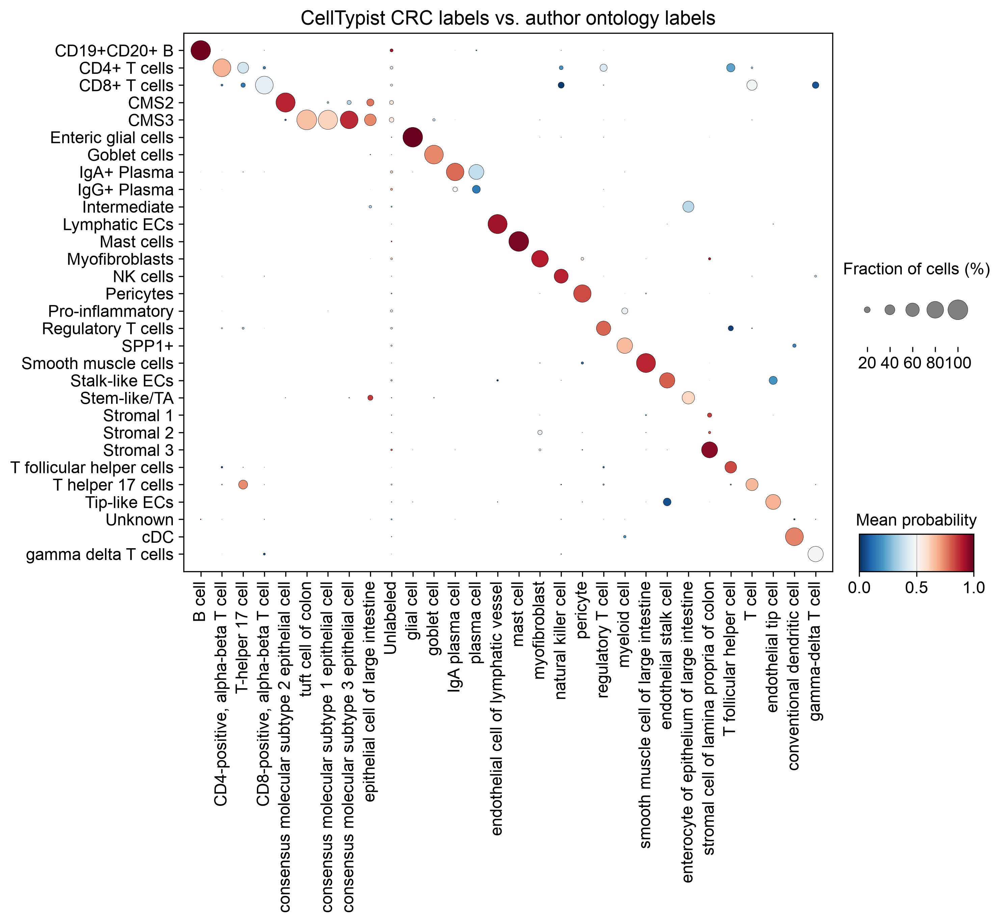

In [16]:
author_labels = (
    adata_qc.obs["inferred_cell_type_-_ontology_labels"]
    .astype("string")
    .reindex(predictions_crc.predicted_labels.index)
    .fillna("Unlabeled")
)

celltypist.dotplot(
    predictions_crc,
    use_as_reference=author_labels,
    use_as_prediction="majority_voting",
    title="CellTypist CRC labels vs. author ontology labels",
    figsize=(10,7),
)

Broad concordance was observed between CellTypist majority-voting annotations generated using the `Human_Colorectal_Cancer.pkl` reference model and the author-provided ontology labels. Strong agreement was observed for several major populations, including B cells, plasma cells, mast cells, enteric glial cells, stromal and contractile populations, lymphatic endothelial cells, and epithelial/tumor compartments. Differences were most apparent among related T-cell, myeloid, endothelial, and epithelial-state labels, likely reflecting differences in annotation granularity and label taxonomy between the CellTypist colorectal cancer reference and the author-defined ontology. Because the author-provided labels were included with the dataset, this comparison was treated as a benchmarking exercise rather than independent confirmation of cell identity.

Next, cells identified as immune cells using the colorectal cancer reference were subsetted and re-annotated using CellTypist `Immune_All_Low.pkl` immune reference model. Fine-grained immune predictions were evaluated against the colorectal cancer model, immune-only Leiden clusters, CellTypist confidence scores, and canonical lineage-marker expression. Where results were discordant or low confidence, broader immune lineage labels were retained.

In [17]:
immune_labels = [
    "CD4+ T cells",
    "CD8+ T cells",
    "Regulatory T cells",
    "T helper 17 cells",
    "T follicular helper cells",
    "gamma delta T cells",
    "NK cells",
    "CD19+CD20+ B",
    "IgA+ Plasma",
    "IgG+ Plasma",
    "SPP1+",
    "Pro-inflammatory",
    "cDC",
    "Mast cells",
]

adata_immune = adata_qc[
    adata_qc.obs["celltypist_crc_majority_voting"].isin(immune_labels)
].copy()

adata_immune

AnnData object with n_obs × n_vars = 23866 × 38263
    obs: 'age', 'developmental_stage', 'disease', 'individual', 'organism_part', 'organism', 'sampling_site', 'sex', 'inferred_cell_type_-_ontology_labels', 'inferred_cell_type_-_authors_labels', 'sampling_site.1', 'age_ontology', 'developmental_stage_ontology', 'disease_ontology', 'individual_ontology', 'organism_part_ontology', 'organism_ontology', 'sampling_site_ontology', 'sex_ontology', 'inferred_cell_type_-_ontology_labels_ontology', 'inferred_cell_type_-_authors_labels_ontology', 'sampling_site_ontology.1', 'biosample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'is_good_sample', 'qc_low_counts', 'qc_low_genes', 'qc_high_mt', 'qc_very_low_genes', 'qc_very_high_mt', 'qc_fail_good_sample', 'qc_keep_cell_from_bad_sample', 'leiden_0_05', 'leiden_0_1', 'leiden_0_5', 'celltypist_crc_predicted_labels', 'celltypist_crc_over_clust

In [18]:
# Run Cell Typist
adata_immune.var_names = (
    adata_immune.var["gene_symbol"]
    .astype(str)
)
adata_immune.var_names_make_unique()

try:
    predictions_immune = celltypist.annotate(
        adata_immune,
        model="Immune_All_Low.pkl", # downloaded using celltypist.models.model_download(model = "Human_Colorectal_Cancer.pkl")
        majority_voting=True,
    )
finally:
    adata_immune.var_names = adata_immune.var["source_gene_id"]

🔬 Input data has 23866 cells and 38263 genes
🔗 Matching reference genes in the model
🧬 5416 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 15
🗳️ Majority voting the predictions
✅ Majority voting done!


In [19]:
predictions_immune.predicted_labels.columns.tolist()

['predicted_labels', 'over_clustering', 'majority_voting']

In [20]:
adata_immune.obs["celltypist_immune_low_predicted"] = (
    predictions_immune.predicted_labels["predicted_labels"]
    .reindex(adata_immune.obs_names)
)

adata_immune.obs["celltypist_immune_low_over_clustering"] = (
    predictions_immune.predicted_labels["over_clustering"]
    .reindex(adata_immune.obs_names)
)

adata_immune.obs["celltypist_immune_low_majority"] = (
    predictions_immune.predicted_labels["majority_voting"]
    .reindex(adata_immune.obs_names)
)

In [21]:
# Insert confidence score
predictions_immune.to_adata(
    insert_labels=True,
    insert_conf=True,
    insert_conf_by="majority_voting",
    prefix="celltypist_immune_low_",
)

AnnData object with n_obs × n_vars = 23866 × 38263
    obs: 'age', 'developmental_stage', 'disease', 'individual', 'organism_part', 'organism', 'sampling_site', 'sex', 'inferred_cell_type_-_ontology_labels', 'inferred_cell_type_-_authors_labels', 'sampling_site.1', 'age_ontology', 'developmental_stage_ontology', 'disease_ontology', 'individual_ontology', 'organism_part_ontology', 'organism_ontology', 'sampling_site_ontology', 'sex_ontology', 'inferred_cell_type_-_ontology_labels_ontology', 'inferred_cell_type_-_authors_labels_ontology', 'sampling_site_ontology.1', 'biosample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'is_good_sample', 'qc_low_counts', 'qc_low_genes', 'qc_high_mt', 'qc_very_low_genes', 'qc_very_high_mt', 'qc_fail_good_sample', 'qc_keep_cell_from_bad_sample', 'leiden_0_05', 'leiden_0_1', 'leiden_0_5', 'celltypist_crc_predicted_labels', 'celltypist_crc_over_clust

In [22]:
predictions_immune.adata.obs.columns.tolist()

['age',
 'developmental_stage',
 'disease',
 'individual',
 'organism_part',
 'organism',
 'sampling_site',
 'sex',
 'inferred_cell_type_-_ontology_labels',
 'inferred_cell_type_-_authors_labels',
 'sampling_site.1',
 'age_ontology',
 'developmental_stage_ontology',
 'disease_ontology',
 'individual_ontology',
 'organism_part_ontology',
 'organism_ontology',
 'sampling_site_ontology',
 'sex_ontology',
 'inferred_cell_type_-_ontology_labels_ontology',
 'inferred_cell_type_-_authors_labels_ontology',
 'sampling_site_ontology.1',
 'biosample_id',
 'n_genes_by_counts',
 'total_counts',
 'total_counts_mt',
 'pct_counts_mt',
 'total_counts_ribo',
 'pct_counts_ribo',
 'total_counts_hb',
 'pct_counts_hb',
 'is_good_sample',
 'qc_low_counts',
 'qc_low_genes',
 'qc_high_mt',
 'qc_very_low_genes',
 'qc_very_high_mt',
 'qc_fail_good_sample',
 'qc_keep_cell_from_bad_sample',
 'leiden_0_05',
 'leiden_0_1',
 'leiden_0_5',
 'celltypist_crc_predicted_labels',
 'celltypist_crc_over_clustering',
 'cellty

In [23]:
adata_immune.obs["celltypist_immune_low_conf_score"] = (
    predictions_immune.adata.obs["celltypist_immune_low_conf_score"]
    .reindex(adata_immune.obs_names)
)

adata_immune.obs[
    [
        "celltypist_crc_majority_voting",
        "celltypist_immune_low_predicted",
        "celltypist_immune_low_majority",
        "celltypist_immune_low_conf_score",
    ]
].head()

,celltypist_crc_majority_voting,celltypist_immune_low_predicted,celltypist_immune_low_majority,celltypist_immune_low_conf_score
SAMEA6057388-AAACATCGTTTACTCT,Pro-inflammatory,Classical monocytes,Alveolar macrophages,0.015586
SAMEA6057388-AAACCTGTCACCACCT,SPP1+,Macrophages,Macrophages,0.998596
SAMEA6057388-AAACCTGTCGTCCAGG,Regulatory T cells,Regulatory T cells,Regulatory T cells,0.985866
SAMEA6057388-AAACGGAGTTCCACAA,Pro-inflammatory,Alveolar macrophages,Alveolar macrophages,0.394185
SAMEA6057388-AAAGATGAGAATTCCC,CD4+ T cells,Tem/Effector helper T cells,Tem/Trm cytotoxic T cells,0.001014


In [24]:
crc_vs_immune_prop = pd.crosstab(
    adata_immune.obs["celltypist_crc_majority_voting"],
    adata_immune.obs["celltypist_immune_low_majority"],
    normalize="index",
    dropna=False,
)

crc_vs_immune_prop.round(2)

celltypist_immune_low_majority,Alveolar macrophages,B cells,CD16+ NK cells,Classical monocytes,DC2,Double-positive thymocytes,Germinal center B cells,ILC,Intermediate macrophages,MAIT cells,...,Proliferative germinal center B cells,Regulatory T cells,Tcm/Naive helper T cells,Tem/Effector helper T cells,Tem/Temra cytotoxic T cells,Tem/Trm cytotoxic T cells,Trm cytotoxic T cells,Type 1 helper T cells,Type 17 helper T cells,gamma-delta T cells
celltypist_crc_majority_voting,,,,,,,,,,,,,,,,,,,,,
CD19+CD20+ B,0.00,0.04,0.00,0.00,0.00,0.00,0.14,0.00,0.00,0.00,...,0.05,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
CD4+ T cells,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.03,...,0.00,0.22,0.48,0.10,0.00,0.03,0.00,0.12,0.02,0.00
CD8+ T cells,0.00,0.00,0.00,0.00,0.00,0.06,0.00,0.00,0.00,0.00,...,0.00,0.14,0.00,0.00,0.20,0.40,0.17,0.01,0.00,0.00
IgA+ Plasma,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.04,0.00,0.00,0.00,0.00,0.00,0.00,0.00
IgG+ Plasma,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
Mast cells,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
NK cells,0.00,0.00,0.55,0.00,0.00,0.00,0.00,0.08,0.00,0.00,...,0.00,0.00,0.00,0.00,0.33,0.03,0.00,0.00,0.00,0.00
Pro-inflammatory,0.28,0.00,0.00,0.31,0.04,0.00,0.00,0.00,0.14,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
Regulatory T cells,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.97,0.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [25]:
crc_vs_immune_summary = pd.DataFrame(
    {
        "crc_label": crc_vs_immune_prop.index,
        "dominant_immune_low_label": crc_vs_immune_prop.idxmax(axis=1),
        "dominant_immune_low_pct": (
            crc_vs_immune_prop.max(axis=1) * 100
        ).round(1),
        "immune_low_median_confidence": (
            adata_immune.obs
            .groupby(
                "celltypist_crc_majority_voting",
                observed=True,
            )["celltypist_immune_low_conf_score"]
            .median()
            .reindex(crc_vs_immune_prop.index)
            .round(3)
        ),
    }
).reset_index(drop=True)

crc_vs_immune_summary

,crc_label,dominant_immune_low_label,dominant_immune_low_pct,immune_low_median_confidence
0,CD19+CD20+ B,Memory B cells,68.7,0.233
1,CD4+ T cells,Tcm/Naive helper T cells,48.3,0.074
2,CD8+ T cells,Tem/Trm cytotoxic T cells,40.3,0.089
3,IgA+ Plasma,Plasma cells,96.0,0.990
4,IgG+ Plasma,Plasma cells,99.8,0.992
5,Mast cells,Mast cells,100.0,0.999
6,NK cells,CD16+ NK cells,55.3,0.028
7,Pro-inflammatory,Classical monocytes,30.8,0.049
8,Regulatory T cells,Regulatory T cells,96.8,0.994
9,SPP1+,Macrophages,75.3,0.354


Strong cross-model concordance was observed for plasma cells, mast cells, and regulatory T cells, while the CRC SPP1+ population was predominantly assigned a macrophage label by the immune reference. Broad lineage agreement was observed for B cells, CD4 and CD8 T cells, NK cells, myeloid cells, and conventional dendritic cells; however, the fine-grained Immune All Low subtype assignments for many of these populations had low median confidence. Consequently, final labels were retained at broad lineage resolution unless supported by high-confidence agreement and canonical marker expression.

| CRC CellTypist label                                       | Final cell type             | Basis                                                                                                 |
| ---------------------------------------------------------- | --------------------------- | ----------------------------------------------------------------------------------------------------- |
| CMS2, CMS3, Stem-like/TA, Goblet cells, Intermediate       | Epithelial/tumor            | These are epithelial/tumor programs or epithelial differentiation states, not separate broad lineages |
| CD19+CD20+ B                                               | B cell                      | Broad B-cell identity is supported; Immune Low’s “Memory B” subtype is low confidence                 |
| IgA+ Plasma, IgG+ Plasma                                   | Plasma cell                 | Strong agreement with Immune Low Plasma cells                                                         |
| CD4+ T cells, T helper 17 cells, T follicular helper cells | CD4 T cell                  | Fine reassignments are inconsistent/low confidence                                                    |
| CD8+ T cells                                               | CD8/cytotoxic T cell        | Immune Low broadly supports a cytotoxic T-cell identity but not a robust Tem/Trm subtype call         |
| Regulatory T cells                                         | Regulatory T cell           | 96.8% agreement and high Immune Low confidence                                                        |
| gamma delta T cells                                        | Gamma-delta T cell          | Same lineage in both models; keep as provisional due to moderate confidence                           |
| NK cells                                                   | NK cell                     | Broad NK identity supported; do not claim CD16+ subtype                                               |
| SPP1+                                                      | SPP1+ macrophage            | CRC model and Immune Low macrophage assignment are concordant at broad lineage level                  |
| Pro-inflammatory                                           | Inflammatory myeloid cell   | Immune Low subtype mapping is weak, but broad myeloid identity is plausible                           |
| cDC                                                        | Conventional dendritic cell | Broad cDC identity is retained; do not claim DC2 from low-confidence Immune Low output                |
| Mast cells                                                 | Mast cell                   | Strong agreement and high confidence                                                                  |
| Stromal 1, Stromal 2, Stromal 3                            | Fibroblast/stromal cell     | Broad stromal identity; retain original subtype label separately                                      |
| Myofibroblasts                                             | Myofibroblast               | Strong, coherent CRC-model label                                                                      |
| Pericytes                                                  | Pericyte                    | Strong CRC-model label                                                                                |
| Smooth muscle cells                                        | Smooth muscle cell          | Strong CRC-model label                                                                                |
| Stalk-like ECs, Tip-like ECs, Lymphatic ECs                | Endothelial cell            | Broad vascular lineage retained; keep state-specific model label separately                           |
| Enteric glial cells                                        | Enteric glial cell          | Strong CRC-model label                                                                                |
| Unknown                                                    | Unknown                     | Preserve uncertainty rather than forcing a label                                                      |

In [26]:
# Final cell annotations
crc_to_final_label = {
    # Epithelial and tumor-associated programs
    "CMS2": "Epithelial/tumor",
    "CMS3": "Epithelial/tumor",
    "Stem-like/TA": "Stem-like/TA",
    "Goblet cells": "Epithelial/tumor",
    "Intermediate": "Epithelial/tumor",

    # B-cell lineage
    "CD19+CD20+ B": "CD19+CD20+ B",
    "IgA+ Plasma": "Plasma cell",
    "IgG+ Plasma": "Plasma cell",

    # T-cell and NK-cell lineages
    "CD4+ T cells": "CD4 T cell",
    "CD8+ T cells": "CD8/cytotoxic T cell",
    "Regulatory T cells": "Regulatory T cell",
    "T helper 17 cells": "CD4 T cell",
    "T follicular helper cells": "CD4 T cell",
    "gamma delta T cells": "Gamma-delta T cell",
    "NK cells": "NK cell",

    # Myeloid lineages
    "SPP1+": "SPP1+ macrophage",
    "Pro-inflammatory": "Inflammatory myeloid cell",
    "cDC": "Conventional dendritic cell",
    "Mast cells": "Mast cell",

    # Fibroblast and other stromal lineages
    "Stromal 1": "Stromal 1",
    "Stromal 2": "Fibroblast/stromal cell",
    "Stromal 3": "Stromal 3",
    "Myofibroblasts": "Myofibroblast",

    # Mural / contractile lineages
    "Pericytes": "Pericyte",
    "Smooth muscle cells": "Smooth muscle cells",

    # Endothelial lineages
    "Stalk-like ECs": "Endothelial cell",
    "Tip-like ECs": "Endothelial cell",
    "Lymphatic ECs": "Lymphatic endothelial cell",

    # Other tissue-resident populations
    "Enteric glial cells": "Enteric glial cell",

    # Uncertain assignment
    "Unknown": "Unknown",
}

In [27]:
# Verify coverage
crc_labels = set(
    adata_qc.obs["celltypist_crc_majority_voting"]
    .dropna()
    .unique()
)

mapping_labels = set(crc_to_final_label)

unmapped_labels = sorted(crc_labels - mapping_labels)
unused_mapping_labels = sorted(mapping_labels - crc_labels)

print("Unmapped CellTypist labels:", unmapped_labels)
print("Mapping labels absent from data:", unused_mapping_labels)
print(f"Number of CellTypist labels: {len(crc_labels)}")
print(f"Number of mapping labels: {len(mapping_labels)}")

Unmapped CellTypist labels: []
Mapping labels absent from data: []
Number of CellTypist labels: 30
Number of mapping labels: 30


In [28]:
# Apply final labels
adata_qc.obs["cell_type_final"] = (
    adata_qc.obs["celltypist_crc_majority_voting"]
    .map(crc_to_final_label)
    .fillna("Unknown")
    .astype("category")
)
adata_qc.obs["cell_type_final"].value_counts()

cell_type_final
Epithelial/tumor               11024
CD4 T cell                      5094
Plasma cell                     4994
CD19+CD20+ B                    3679
Stromal 3                       3282
CD8/cytotoxic T cell            2609
SPP1+ macrophage                2345
Endothelial cell                2177
Myofibroblast                   1997
Regulatory T cell               1775
Inflammatory myeloid cell       1713
Stem-like/TA                     855
Pericyte                         717
Enteric glial cell               686
Mast cell                        640
Smooth muscle cells              614
Stromal 1                        605
Unknown                          575
Fibroblast/stromal cell          529
Conventional dendritic cell      519
NK cell                          302
Gamma-delta T cell               196
Lymphatic endothelial cell       176
Name: count, dtype: int64

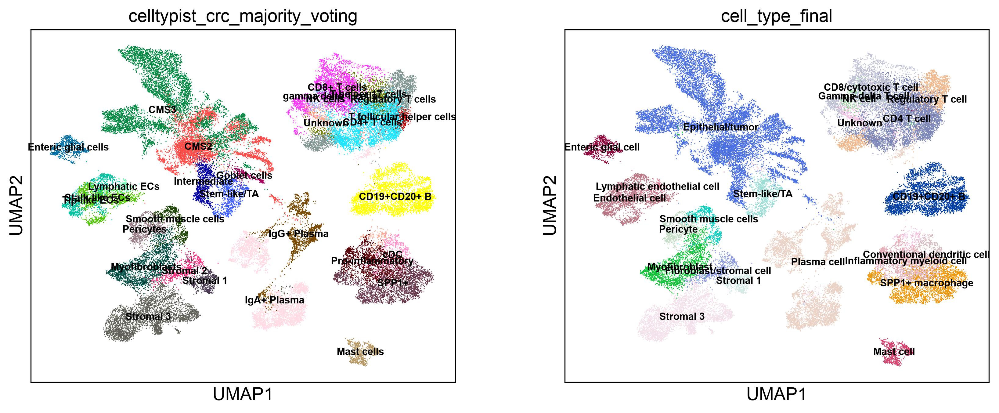

In [29]:
with plt.rc_context({"figure.figsize": (6, 5)}):
    sc.pl.umap(
    adata_qc,
    color=[
        "celltypist_crc_majority_voting",
        "cell_type_final",
    ],
    legend_loc="on data",
    legend_fontsize=8
)


In [30]:
from src.ingest_data import write_h5ad
write_h5ad(
    adata_qc,
    output_path = PROJECT_ROOT / "data" / "interim" / "E-MTAB-8410_annotated.h5ad"
)